In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [83]:
df = pd.read_csv('USStockMarketDataset.csv', parse_dates=[1], index_col=0)
df.head()

,Date,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,Platinum_Price,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
0,2/2/2024,2.079,NaN,72.28,NaN,3.8215,NaN,"43,194.70",42650,901.6,...,"5,89,498",10580,564.64,4030000,171.81,117220000,474.99,84710000,"2,053.70",NaN
1,1/2/2024,2.050,161340.0,73.82,577940.0,3.8535,NaN,"43,081.40",47690,922.3,...,"5,81,600",9780,567.51,3150000,159.28,66360000,394.78,25140000,"2,071.10",260920.0
2,31-01-2024,2.100,142860.0,75.85,344490.0,3.9060,NaN,"42,580.50",56480,932.6,...,"5,78,020",9720,564.11,4830000,155.20,49690000,390.14,20010000,"2,067.40",238370.0
3,30-01-2024,2.077,139750.0,77.82,347240.0,3.9110,NaN,"42,946.20",55130,931.7,...,"5,84,680",9750,562.85,6120000,159.00,42290000,400.06,18610000,"2,050.90",214590.0
4,29-01-2024,2.490,3590.0,76.78,331930.0,3.8790,NaN,"43,299.80",45230,938.3,...,"5,78,800",13850,575.79,6880000,161.26,42840000,401.02,17790000,"2,034.90",1780.0


In [84]:
# convert all dates to one format - if date is in format dd/mm/yyyy convert it to dd-mm-yyyy
df['Date'] = df['Date'].str.replace('/', '-')
df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
# convert all price columns to float, if there is a comma in the number, remove it
price_columns = df.columns.str.contains('Price')
df.loc[:, price_columns] = df.loc[:, price_columns].replace(',', '', regex=True).astype(float)
df.set_index('Date', inplace=True)
df.head()

,Natural_Gas_Price,Natural_Gas_Vol.,Crude_oil_Price,Crude_oil_Vol.,Copper_Price,Copper_Vol.,Bitcoin_Price,Bitcoin_Vol.,Platinum_Price,Platinum_Vol.,...,Berkshire_Price,Berkshire_Vol.,Netflix_Price,Netflix_Vol.,Amazon_Price,Amazon_Vol.,Meta_Price,Meta_Vol.,Gold_Price,Gold_Vol.
Date,,,,,,,,,,,,,,,,,,,,,
2024-02-02,2.079,NaN,72.28,NaN,3.8215,NaN,43194.7,42650,901.6,NaN,...,589498.0,10580,564.64,4030000,171.81,117220000,474.99,84710000,2053.7,NaN
2024-02-01,2.050,161340.0,73.82,577940.0,3.8535,NaN,43081.4,47690,922.3,NaN,...,581600.0,9780,567.51,3150000,159.28,66360000,394.78,25140000,2071.1,260920.0
2024-01-31,2.100,142860.0,75.85,344490.0,3.9060,NaN,42580.5,56480,932.6,NaN,...,578020.0,9720,564.11,4830000,155.20,49690000,390.14,20010000,2067.4,238370.0
2024-01-30,2.077,139750.0,77.82,347240.0,3.9110,NaN,42946.2,55130,931.7,NaN,...,584680.0,9750,562.85,6120000,159.00,42290000,400.06,18610000,2050.9,214590.0
2024-01-29,2.490,3590.0,76.78,331930.0,3.8790,NaN,43299.8,45230,938.3,NaN,...,578800.0,13850,575.79,6880000,161.26,42840000,401.02,17790000,2034.9,1780.0


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1013 entries, 0 to 1012
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               1013 non-null   datetime64[ns]
 1   Natural_Gas_Price  1013 non-null   float64       
 2   Natural_Gas_Vol.   1009 non-null   float64       
 3   Crude_oil_Price    1013 non-null   float64       
 4   Crude_oil_Vol.     990 non-null    float64       
 5   Copper_Price       1013 non-null   float64       
 6   Copper_Vol.        976 non-null    float64       
 7   Bitcoin_Price      1013 non-null   object        
 8   Bitcoin_Vol.       1013 non-null   int64         
 9   Platinum_Price     1013 non-null   object        
 10  Platinum_Vol.      636 non-null    float64       
 11  Ethereum_Price     1013 non-null   object        
 12  Ethereum_Vol.      1013 non-null   int64         
 13  S&P_500_Price      1013 non-null   object        
 14  Nasdaq_100_Pr

In [62]:
df_prices = df[df.columns[df.columns.str.contains('Price')]]
df_prices['Date'] = df['Date']
# make Date column a first column
cols = df_prices.columns.tolist()
cols = cols[-1:] + cols[:-1]
df_prices = df_prices[cols]
df_prices.head()

C:\Users\user\AppData\Local\Temp\ipykernel_5600\1133227026.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_prices['Date'] = df['Date']


,Date,Natural_Gas_Price,Crude_oil_Price,Copper_Price,Bitcoin_Price,Platinum_Price,Ethereum_Price,S&P_500_Price,Nasdaq_100_Price,Apple_Price,Tesla_Price,Microsoft_Price,Silver_Price,Google_Price,Nvidia_Price,Berkshire_Price,Netflix_Price,Amazon_Price,Meta_Price,Gold_Price
0,2024-02-02,2.079,72.28,3.8215,43194.7,901.6,2309.28,4958.61,17642.73,185.85,187.91,411.22,22.796,142.38,661.60,589498.0,564.64,171.81,474.99,2053.7
1,2024-02-01,2.050,73.82,3.8535,43081.4,922.3,2304.28,4906.19,17344.71,186.86,188.86,403.78,23.236,141.16,630.27,581600.0,567.51,159.28,394.78,2071.1
2,2024-01-31,2.100,75.85,3.9060,42580.5,932.6,2283.14,4848.87,17137.24,184.40,187.29,397.58,23.169,140.10,615.27,578020.0,564.11,155.20,390.14,2067.4
3,2024-01-30,2.077,77.82,3.9110,42946.2,931.7,2343.11,4924.97,17476.71,188.04,191.59,408.59,23.225,151.46,627.74,584680.0,562.85,159.00,400.06,2050.9
4,2024-01-29,2.490,76.78,3.8790,43299.8,938.3,2317.79,4927.93,17596.27,191.73,190.93,409.72,23.134,153.51,624.65,578800.0,575.79,161.26,401.02,2034.9


In [63]:
# show null values in the columns
df_prices.isnull().sum()

Date                 0
Natural_Gas_Price    0
Crude_oil_Price      0
Copper_Price         0
Bitcoin_Price        0
Platinum_Price       0
Ethereum_Price       0
S&P_500_Price        0
Nasdaq_100_Price     0
Apple_Price          0
Tesla_Price          0
Microsoft_Price      0
Silver_Price         0
Google_Price         0
Nvidia_Price         0
Berkshire_Price      0
Netflix_Price        0
Amazon_Price         0
Meta_Price           0
Gold_Price           0
dtype: int64

In [64]:
df_prices.describe()

,Date,Natural_Gas_Price,Crude_oil_Price,Copper_Price,Apple_Price,Tesla_Price,Microsoft_Price,Silver_Price,Google_Price,Nvidia_Price,Netflix_Price,Amazon_Price,Meta_Price
count,1013,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000,1013.000000
mean,2022-01-18 19:55:29.911154944,3.726667,69.853475,3.726843,141.964462,208.928263,265.838855,22.795356,108.659882,219.738065,422.035479,137.426209,252.151046
min,2020-01-02 00:00:00,1.482000,-37.630000,2.100500,56.090000,24.080000,135.420000,11.772000,52.710000,49.100000,166.370000,81.820000,88.910000
25%,2021-01-08 00:00:00,2.447000,54.760000,3.408000,124.610000,160.950000,223.290000,21.327000,88.130000,131.980000,338.630000,114.770000,195.210000
50%,2022-01-20 00:00:00,2.880000,72.910000,3.800500,146.500000,222.640000,260.790000,23.383000,111.450000,179.130000,431.600000,142.300000,262.010000
75%,2023-01-31 00:00:00,4.805000,82.810000,4.251500,168.640000,261.160000,308.650000,24.949000,131.910000,272.470000,509.640000,161.060000,313.190000
max,2024-02-02 00:00:00,9.647000,123.700000,4.937500,198.110000,409.970000,411.220000,29.418000,153.510000,661.600000,691.690000,186.570000,474.990000
std,NaN,1.943030,21.986697,0.646524,33.778785,84.917541,57.493641,3.170649,25.438302,128.668703,119.765870,27.321896,72.949246


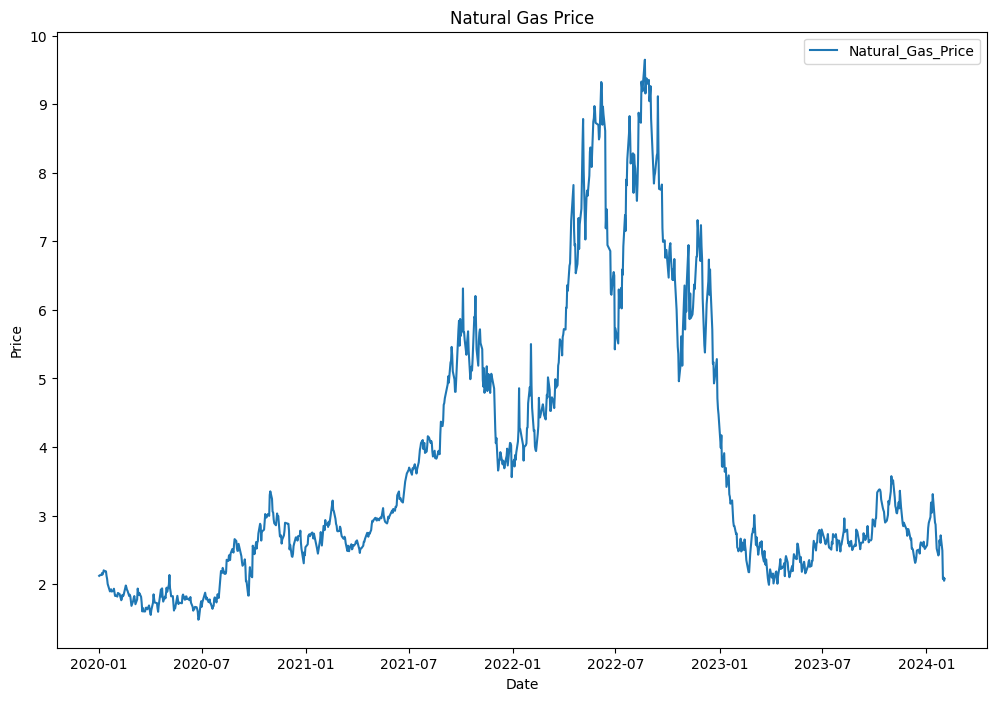

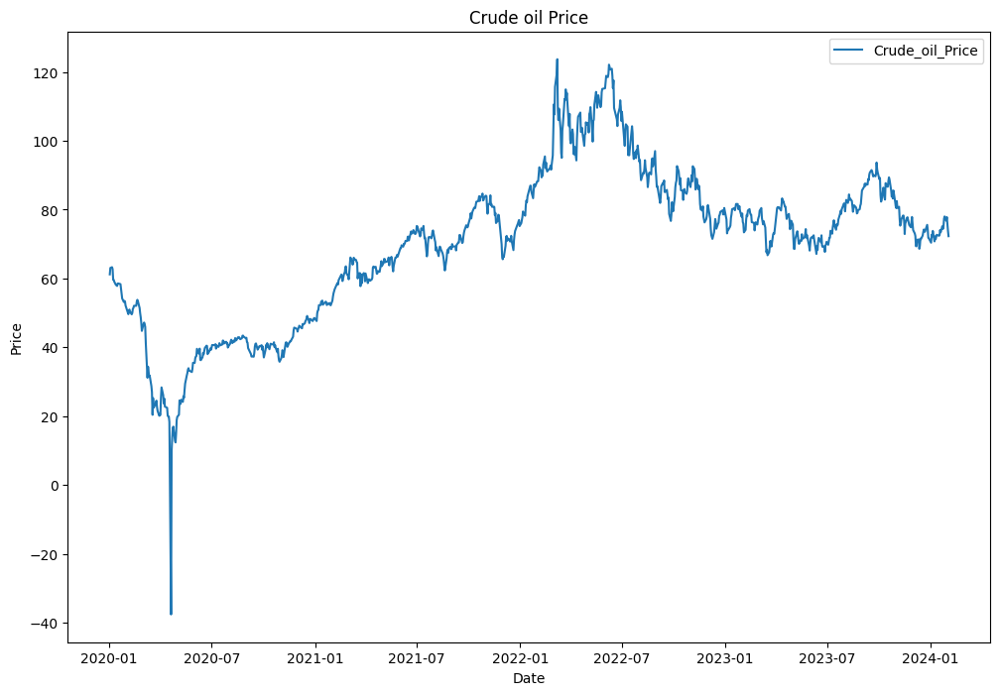

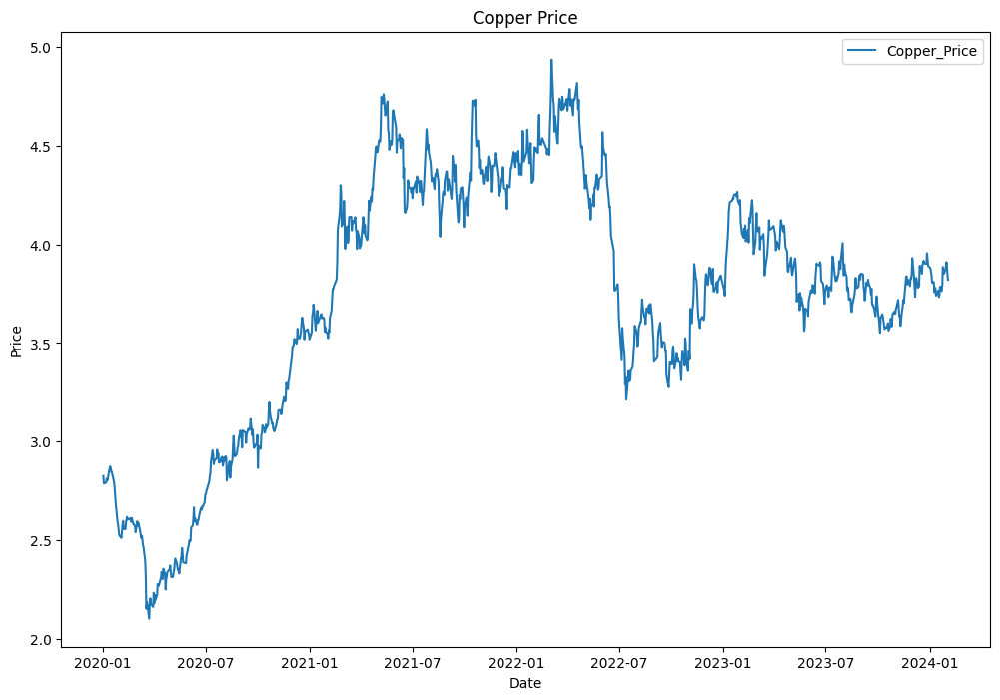

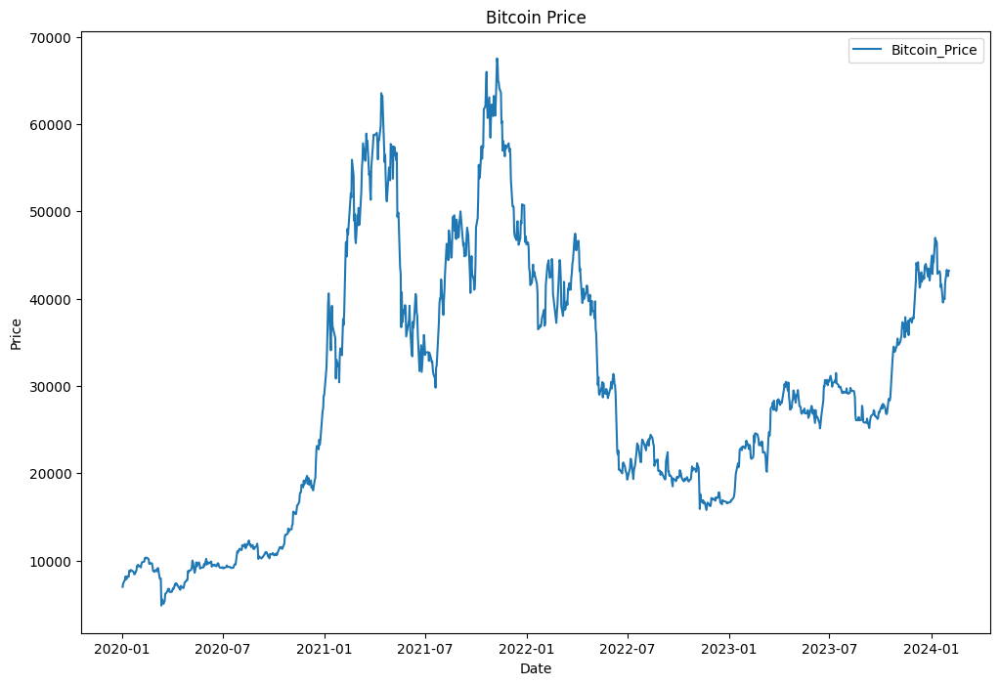

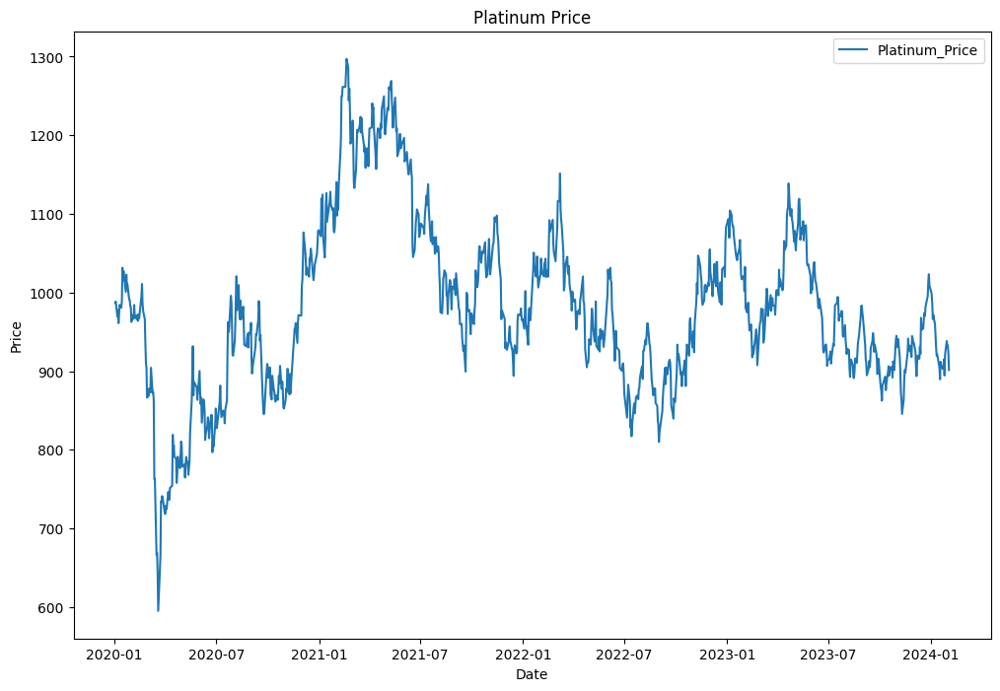

...

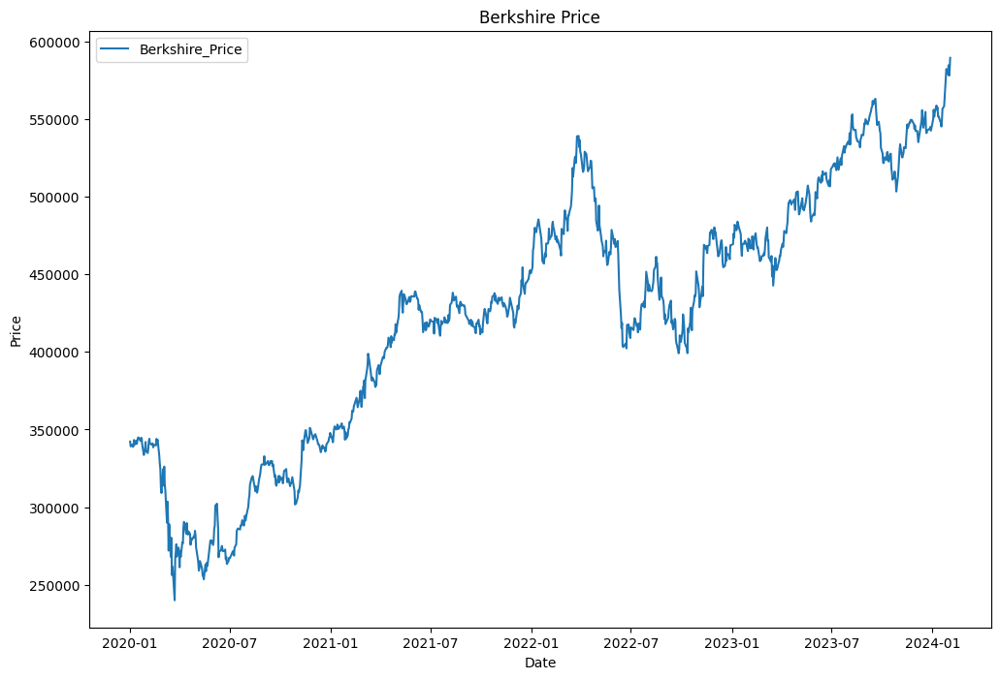

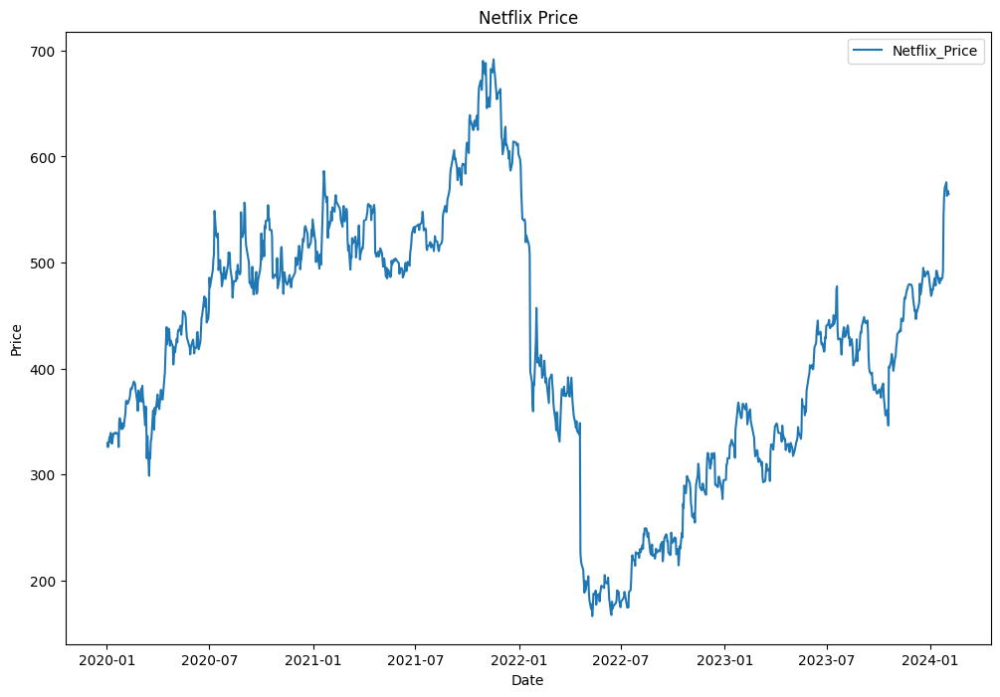

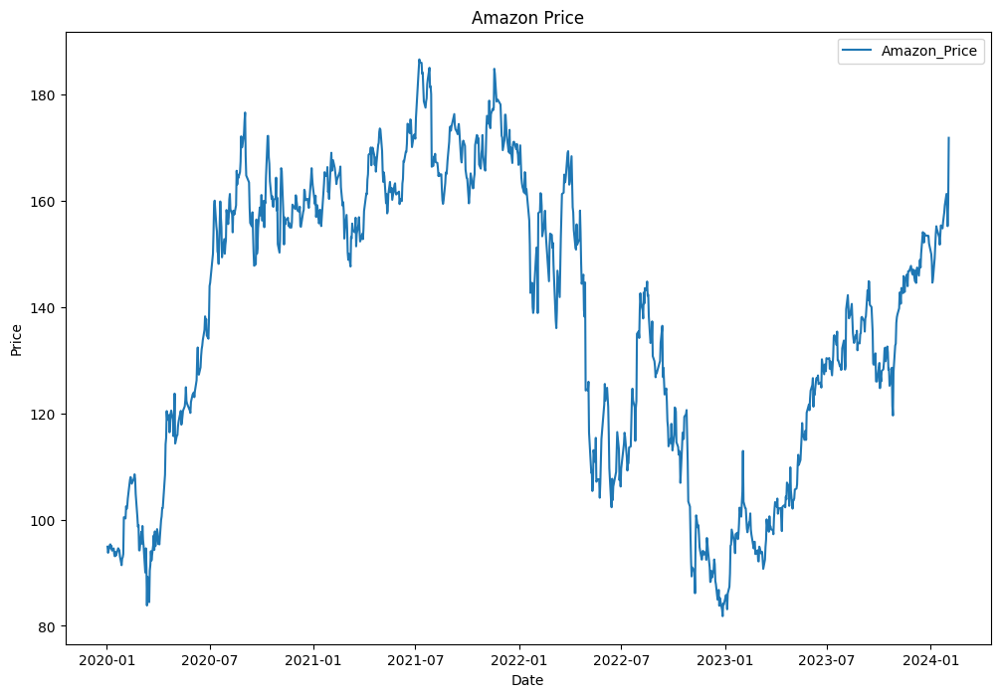

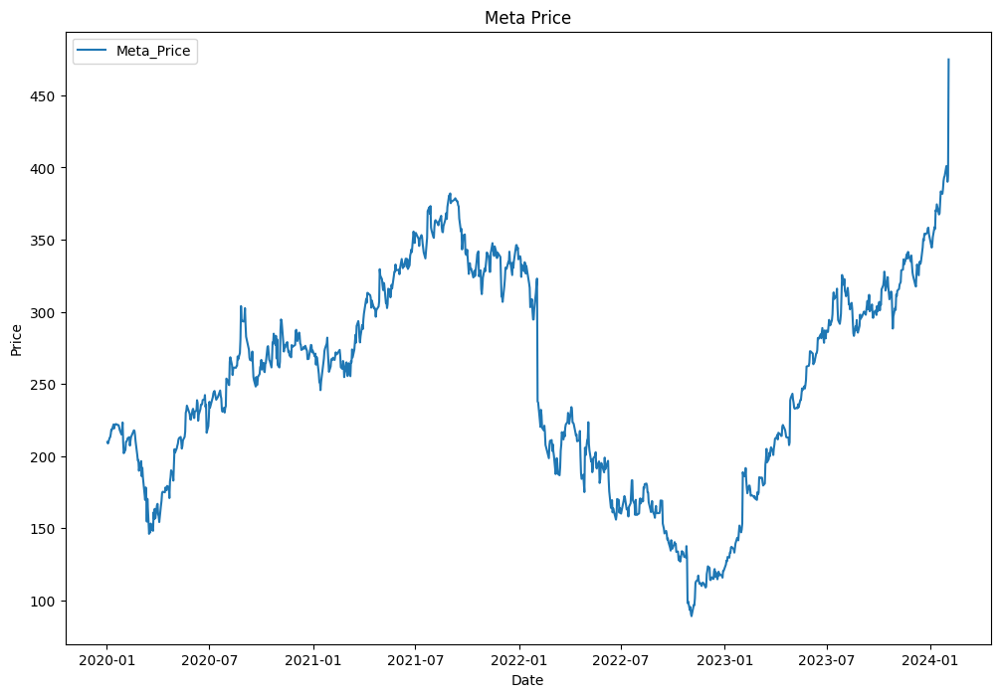

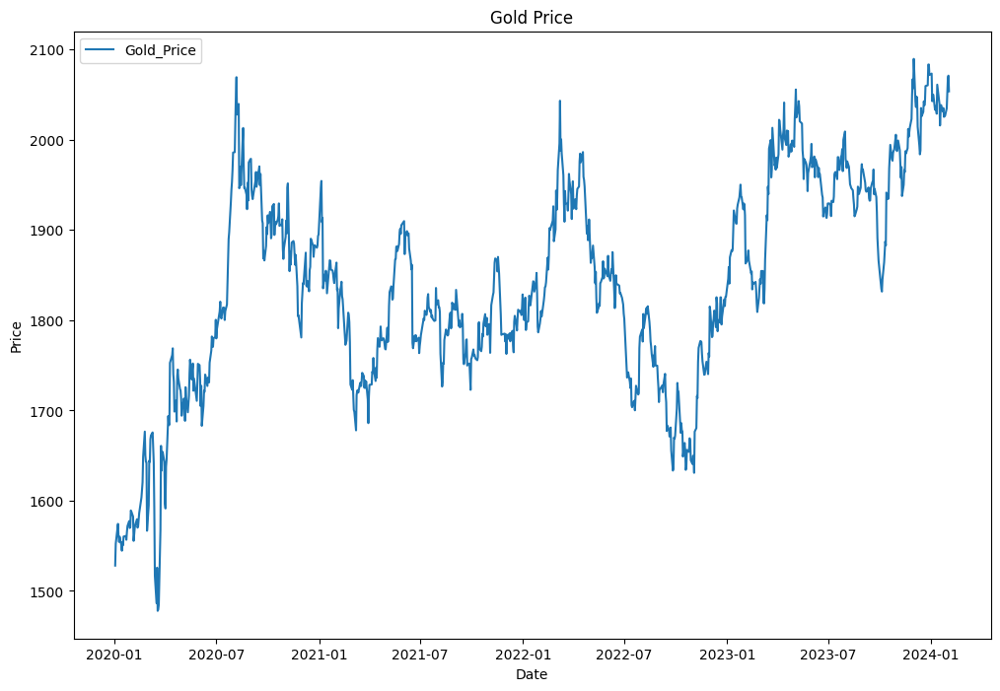

In [65]:
max_price = 0
for c in df_prices.columns:
    if c != 'Date':
        plt.figure(figsize=(12, 8))  # Create a new figure for each plot
        plt.plot(df_prices['Date'], df_prices[c], label=c)
        max_price = max(max_price, df_prices[c].max())
        plt.title(f'{' '.join(c.split("_"))}')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend()
        plt.show()

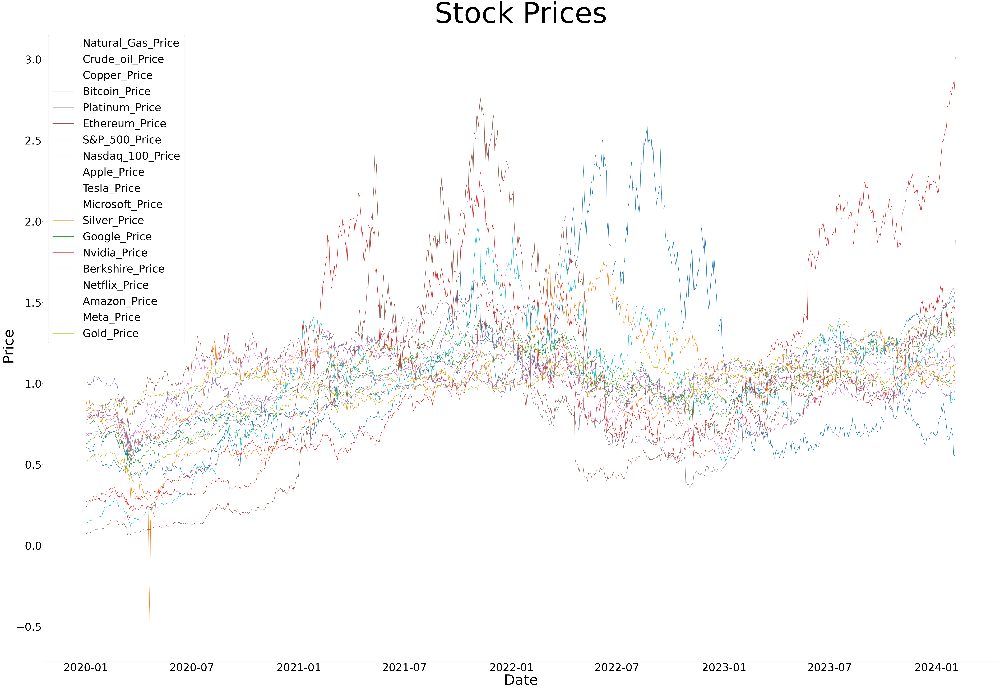

In [66]:
# plot all prices on one plot with different colors, and divide their values by their mean to make them comparable
plt.figure(figsize=(96, 64))
for c in df_prices.columns:
    if c != 'Date':
        plt.plot(df_prices['Date'], df_prices[c] / df_prices[c].mean(), label=c)
plt.title('Stock Prices', size=160)
plt.xlabel('Date', size=80)
plt.ylabel('Price', size=80)
plt.legend(prop={'size': 60})
plt.xticks(size=60)
plt.yticks(size=60)
plt.show()

In [67]:
# show trnd, seasonality and residuals for sp500 using multipication formula, and then plot them
from statsmodels.tsa.seasonal import seasonal_decompose
sp500 = df_prices['S&P_500_Price']
sp500.index = df_prices['Date']
decomposition = seasonal_decompose(sp500, model='multiplicative', period=252)
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

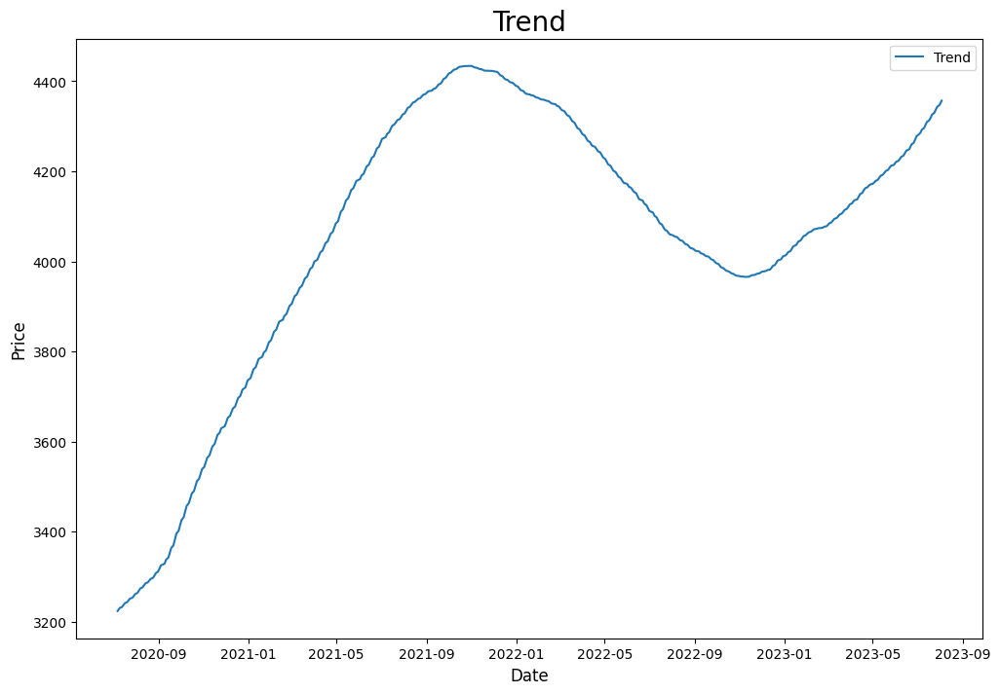

In [68]:
# plot trend
plt.figure(figsize=(12, 8))
plt.plot(trend, label='Trend')
plt.title('Trend', size=20)
plt.xlabel('Date', size=12)
plt.ylabel('Price', size=12)
plt.legend()
plt.show()

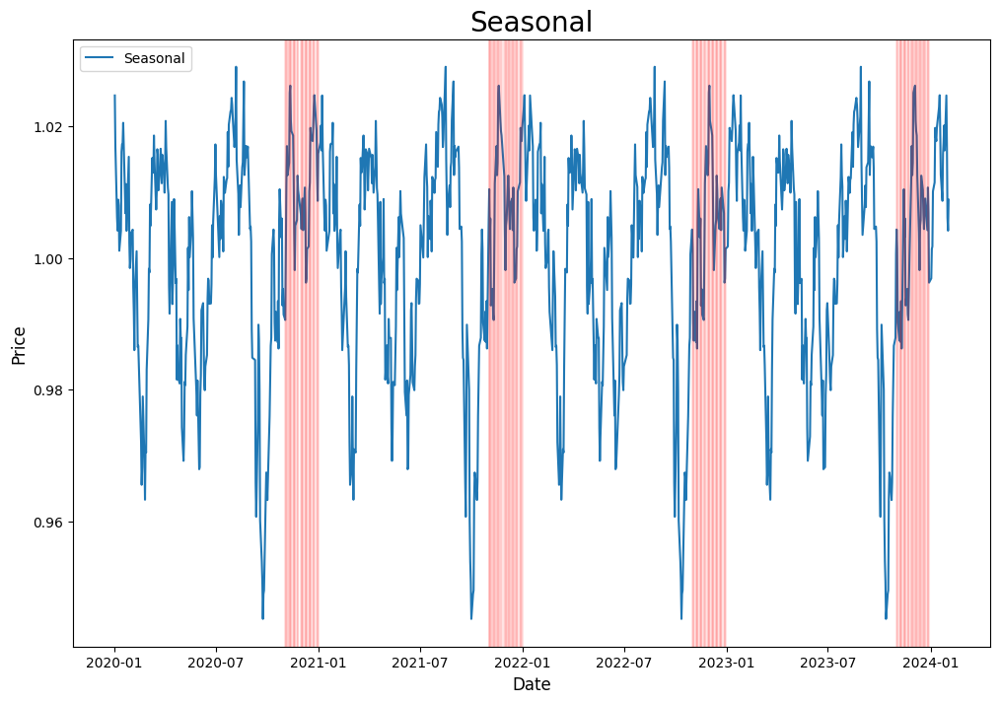

In [69]:
# plot seasonal, marking using red line novembers
plt.figure(figsize=(12, 8))
plt.plot(seasonal, label='Seasonal')
plt.title('Seasonal', size=20)
plt.xlabel('Date', size=12)
plt.ylabel('Price', size=12)
# use some loop to mark novembers, and make it opac
for i in df_prices['Date']:
    if i.month == 11 or i.month == 12:
        plt.axvline(x=i, color='r', alpha=0.1)
plt.legend()
plt.show()

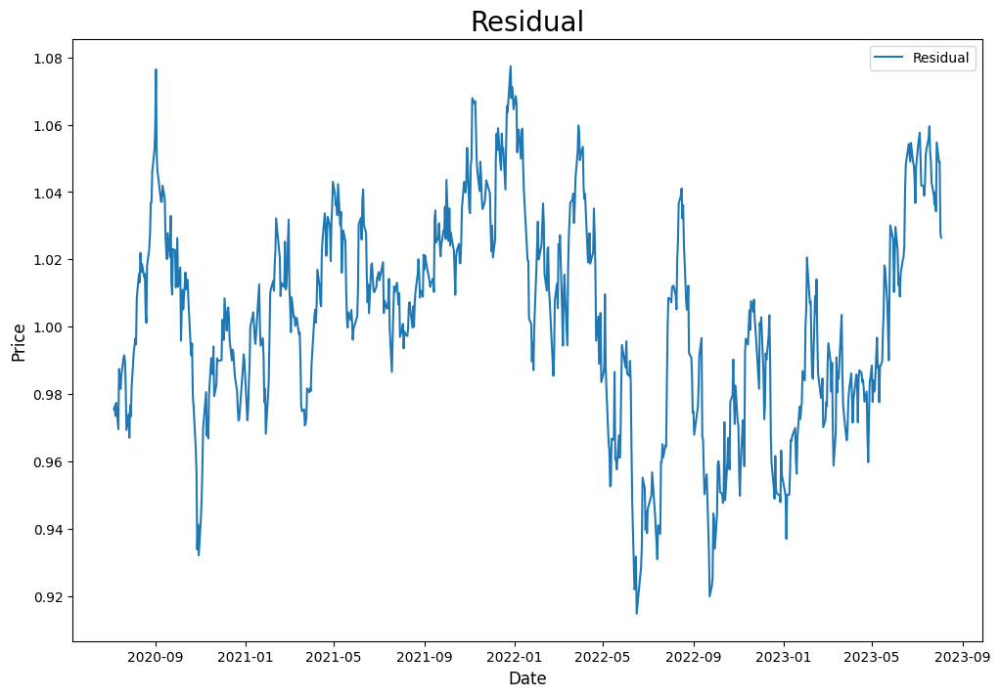

In [70]:
# plot residuals
plt.figure(figsize=(12, 8))
plt.plot(residual, label='Residual')
plt.title('Residual', size=20)
plt.xlabel('Date', size=12)
plt.ylabel('Price', size=12)
plt.legend()
plt.show()

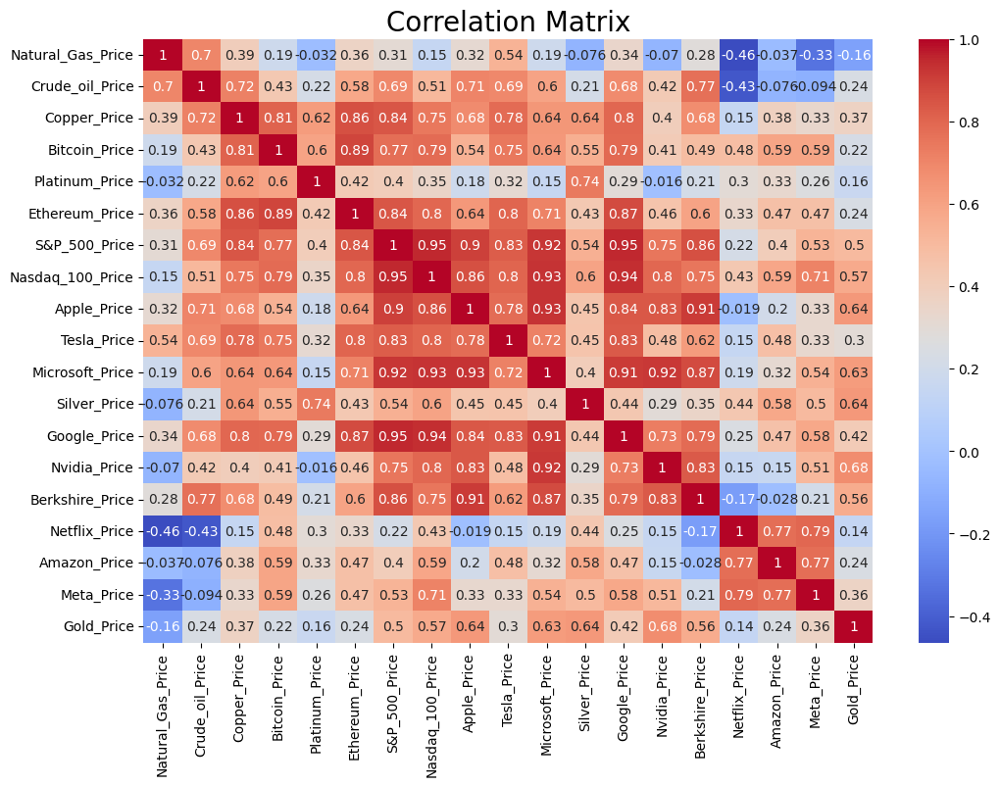

In [71]:
plt.figure(figsize=(12, 8))
# delete date column
df_prices = df_prices.drop('Date', axis=1)
sns.heatmap(df_prices.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix', size=20)
plt.show()

In [72]:
df_vol = df[df.columns[df.columns.str.contains('Vol')]]
df_vol['Date'] = df['Date']

C:\Users\user\AppData\Local\Temp\ipykernel_5600\3750862365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vol['Date'] = df['Date']


In [73]:
df_vol.head()

,Natural_Gas_Vol.,Crude_oil_Vol.,Copper_Vol.,Bitcoin_Vol.,Platinum_Vol.,Ethereum_Vol.,Nasdaq_100_Vol.,Apple_Vol.,Tesla_Vol.,Microsoft_Vol.,Silver_Vol.,Google_Vol.,Nvidia_Vol.,Berkshire_Vol.,Netflix_Vol.,Amazon_Vol.,Meta_Vol.,Gold_Vol.,Date
0,NaN,NaN,NaN,42650,NaN,246890,315620000.0,102550000,110610000,28260000,NaN,62500000,47660000,10580,4030000,117220000,84710000,NaN,2024-02-02
1,161340.0,577940.0,NaN,47690,NaN,323610,240640000.0,53490000,90680000,29230000,85160.0,37120000,36020000,9780,3150000,66360000,25140000,260920.0,2024-02-01
2,142860.0,344490.0,NaN,56480,NaN,408790,366450000.0,54830000,102270000,46780000,66910.0,71370000,45070000,9720,4830000,49690000,20010000,238370.0,2024-01-31
3,139750.0,347240.0,NaN,55130,NaN,387120,236210000.0,55270000,105540000,29340000,53370.0,33060000,39600000,9750,6120000,42290000,18610000,214590.0,2024-01-30
4,3590.0,331930.0,NaN,45230,NaN,318840,238750000.0,46890000,123600000,23290000,330.0,27590000,33900000,13850,6880000,42840000,17790000,1780.0,2024-01-29


In [74]:
# plot na
df_vol.isnull().sum()

Natural_Gas_Vol.      4
Crude_oil_Vol.       23
Copper_Vol.          37
Bitcoin_Vol.          0
Platinum_Vol.       377
Ethereum_Vol.         0
Nasdaq_100_Vol.       1
Apple_Vol.            0
Tesla_Vol.            0
Microsoft_Vol.        0
Silver_Vol.          46
Google_Vol.           0
Nvidia_Vol.           0
Berkshire_Vol.        0
Netflix_Vol.          0
Amazon_Vol.           0
Meta_Vol.             0
Gold_Vol.             2
Date                  0
dtype: int64

In [75]:
df_vol.dropna(inplace=True)

C:\Users\user\AppData\Local\Temp\ipykernel_5600\2535545482.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vol.dropna(inplace=True)


In [76]:
df_vol.describe()

,Natural_Gas_Vol.,Crude_oil_Vol.,Copper_Vol.,Bitcoin_Vol.,Platinum_Vol.,Ethereum_Vol.,Nasdaq_100_Vol.,Apple_Vol.,Tesla_Vol.,Microsoft_Vol.,Silver_Vol.,Google_Vol.,Nvidia_Vol.,Berkshire_Vol.,Netflix_Vol.,Amazon_Vol.,Meta_Vol.,Gold_Vol.,Date
count,609.000000,609.000000,609.000000,6.090000e+02,609.000000,6.090000e+02,6.090000e+02,6.090000e+02,6.090000e+02,6.090000e+02,609.000000,6.090000e+02,6.090000e+02,609.000000,6.090000e+02,6.090000e+02,6.090000e+02,609.000000,609
mean,127938.062397,338256.798030,29898.899836,8.011086e+07,8637.422003,2.815323e+07,2.275341e+08,9.459878e+07,1.049107e+08,2.849287e+07,66681.576355,3.258622e+07,4.502581e+07,2387.684729,6.464269e+06,7.189811e+07,2.377755e+07,189748.801314,2021-12-16 22:37:14.482758400
min,2350.000000,17020.000000,20.000000,2.600000e+02,0.000000,7.518000e+04,6.857000e+07,2.404000e+07,2.940000e+07,9.380000e+06,0.000000,9.310000e+06,9.790000e+06,130.000000,1.140000e+06,2.162000e+07,5.470000e+06,160.000000,2020-08-03 00:00:00
25%,92080.000000,279000.000000,280.000000,7.143000e+04,830.000000,6.196200e+05,1.772000e+08,6.781000e+07,6.797000e+07,2.190000e+07,47280.000000,2.397000e+07,2.975000e+07,980.000000,3.270000e+06,5.196000e+07,1.580000e+07,147260.000000,2021-03-24 00:00:00
50%,125390.000000,349080.000000,1620.000000,1.064400e+05,4900.000000,1.070000e+06,2.128300e+08,8.559000e+07,9.085000e+07,2.612000e+07,60020.000000,2.976000e+07,4.315000e+07,1810.000000,4.710000e+06,6.430000e+07,2.052000e+07,177710.000000,2021-11-10 00:00:00
75%,159820.000000,421770.000000,63830.000000,2.286500e+05,14020.000000,2.320000e+06,2.512000e+08,1.093000e+08,1.235200e+08,3.311000e+07,76730.000000,3.732000e+07,5.639000e+07,2680.000000,7.090000e+06,8.425000e+07,2.813000e+07,229880.000000,2022-07-11 00:00:00
max,381970.000000,722480.000000,176040.000000,4.470000e+09,42830.000000,1.790000e+09,9.825600e+08,3.459400e+08,6.663800e+08,9.043000e+07,355280.000000,1.232000e+08,1.463700e+08,10660.000000,1.333900e+08,2.726600e+08,1.881200e+08,565000.000000,2023-12-21 00:00:00
std,56207.903454,142335.989024,38977.484614,4.158062e+08,8756.170123,1.889170e+08,8.684450e+07,4.220992e+07,5.848199e+07,1.018890e+07,38283.267380,1.317995e+07,1.912250e+07,2199.376944,7.694205e+06,2.930581e+07,1.373930e+07,79755.110167,NaN


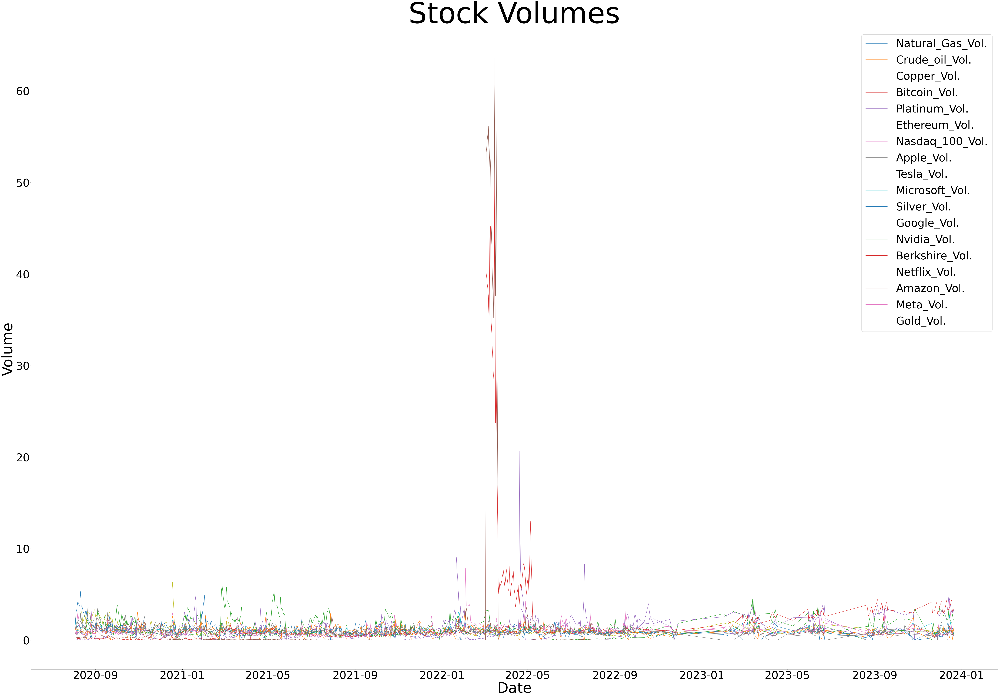

In [77]:
# plot all prices on one plot with different colors, and divide their values by their mean to make them comparable
plt.figure(figsize=(96, 64))
for c in df_vol.columns:
    if c != 'Date':
        plt.plot(df_vol['Date'], df_vol[c] / df_vol[c].mean(), label=c)
plt.title('Stock Volumes', size=160)
plt.xlabel('Date', size=80)
plt.ylabel('Volume', size=80)
plt.legend(prop={'size': 60})
plt.xticks(size=60)
plt.yticks(size=60)
plt.show()

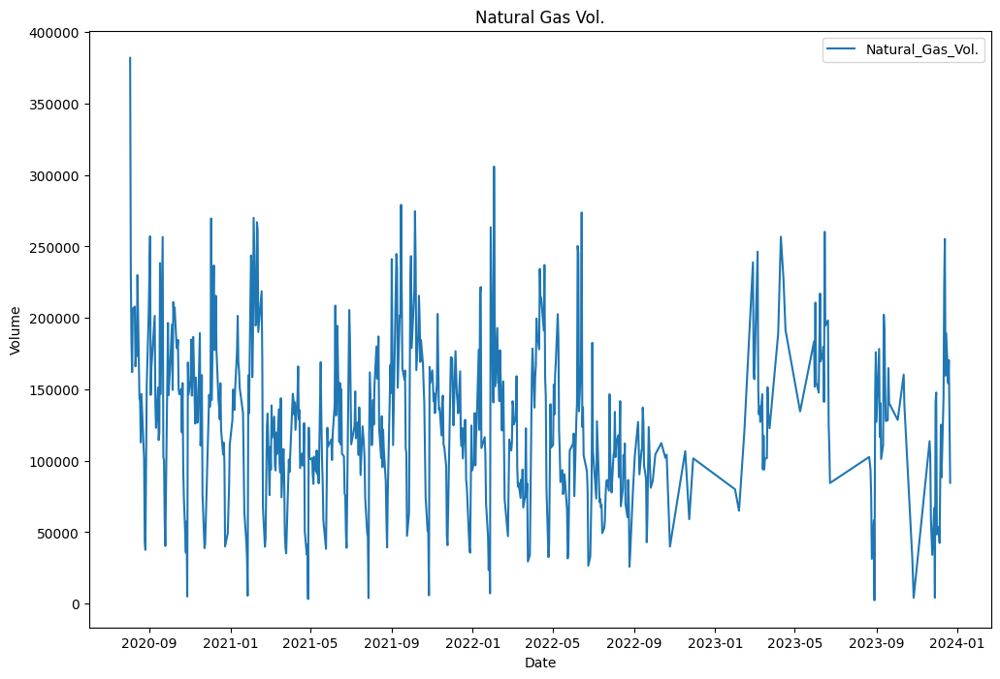

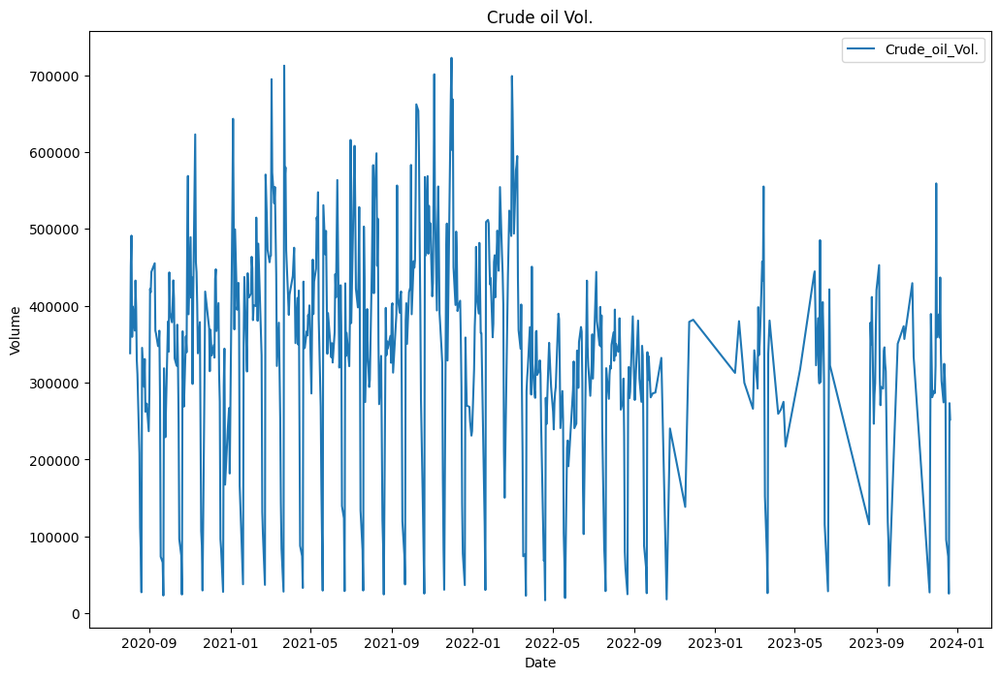

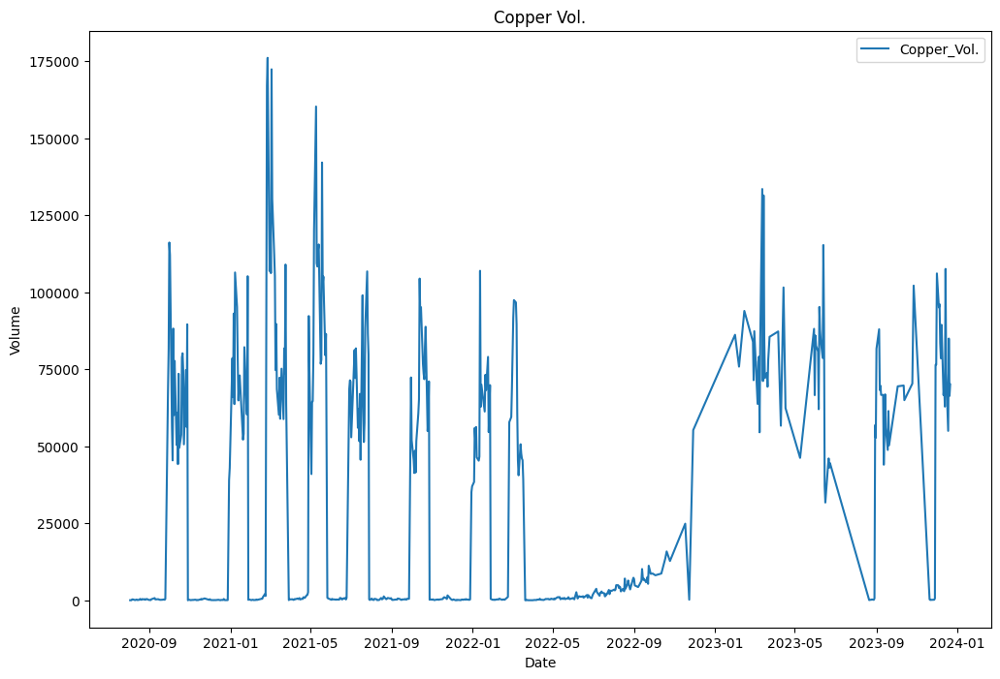

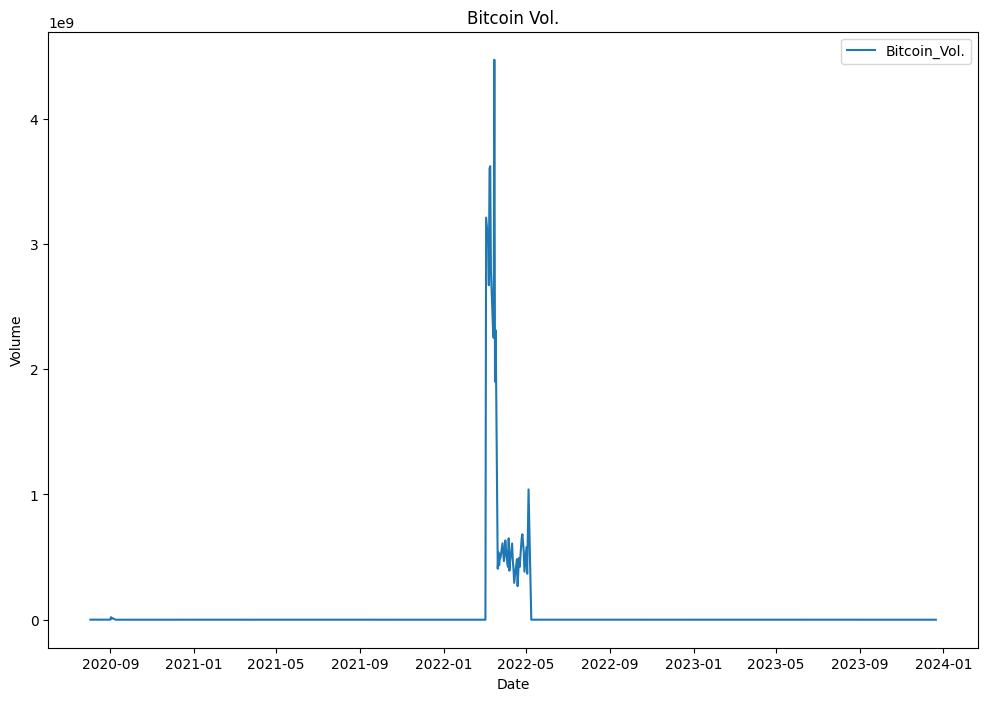

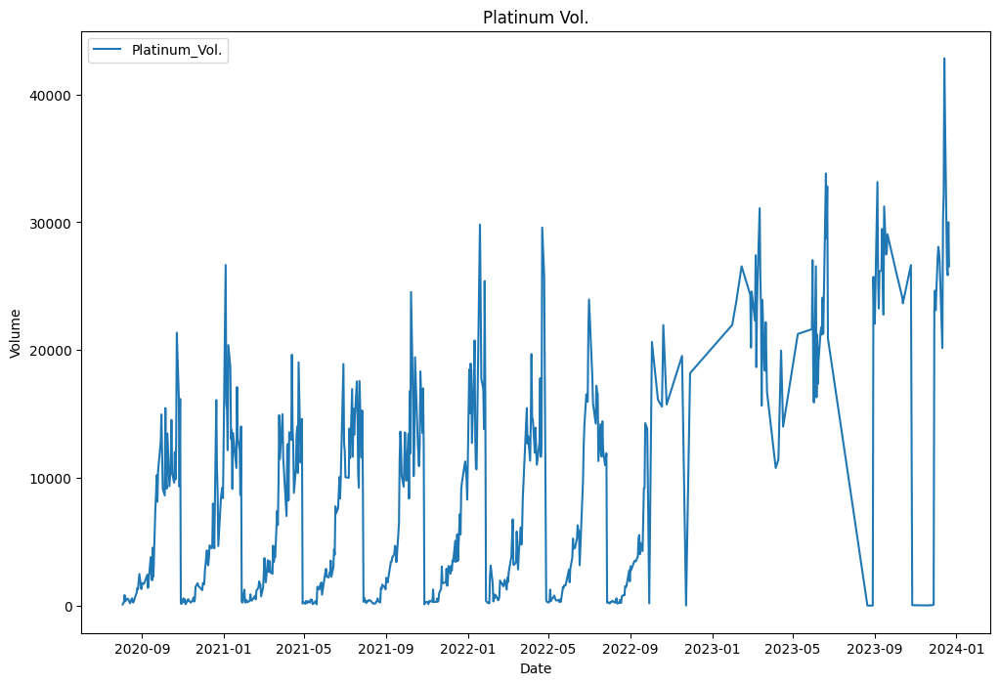

...

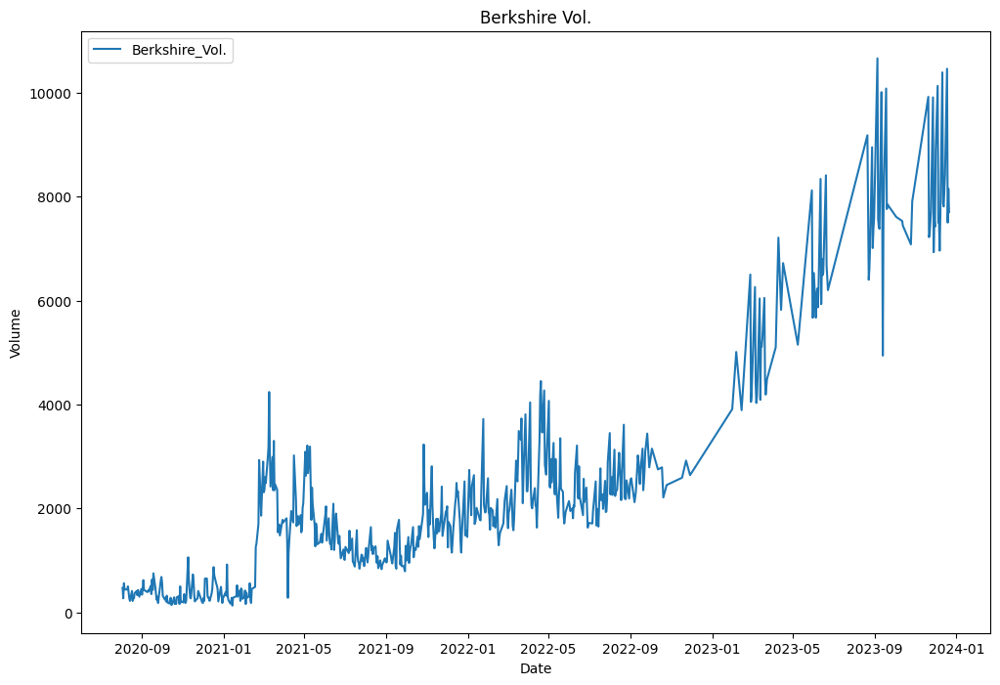

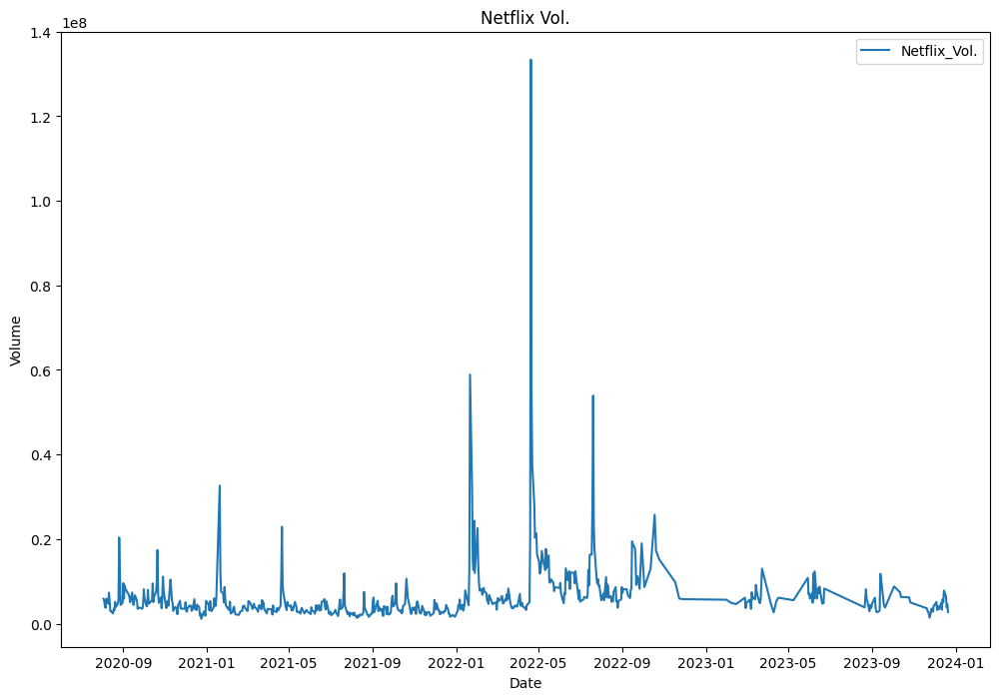

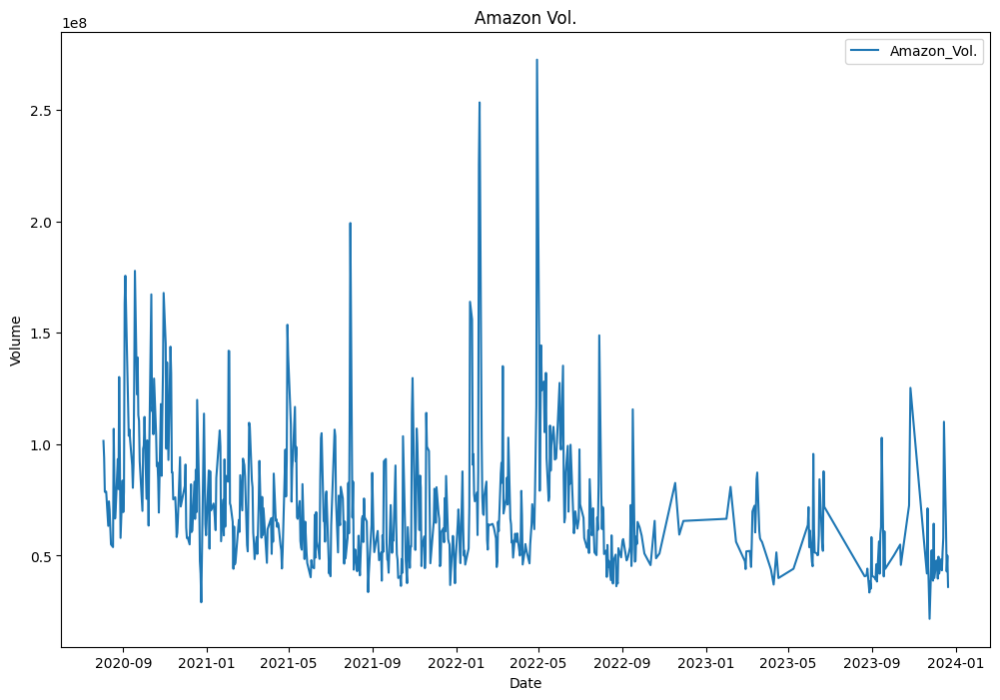

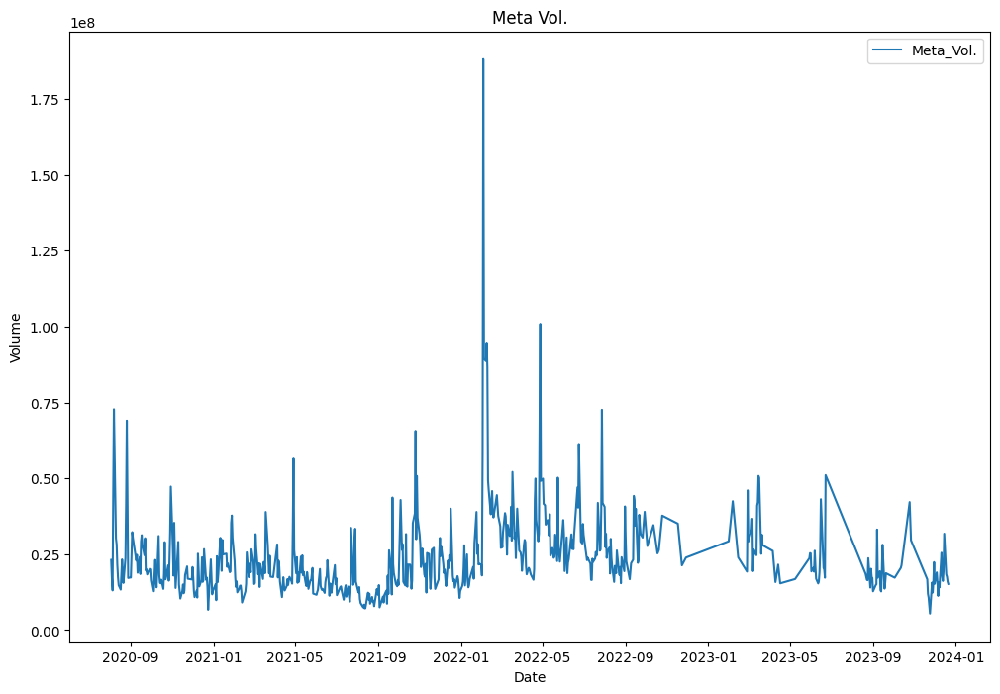

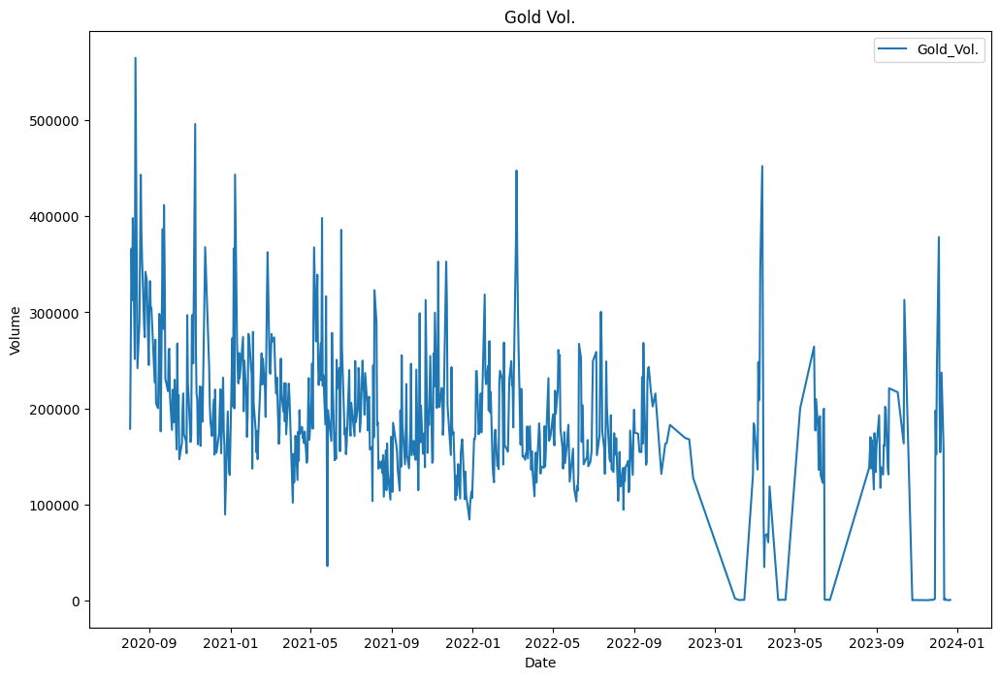

In [78]:
for c in df_vol.columns:
    if c != 'Date':
        plt.figure(figsize=(12, 8))  # Create a new figure for each plot
        plt.plot(df_vol['Date'], df_vol[c], label=c)
        plt.title(f'{' '.join(c.split("_"))}')
        plt.xlabel('Date')
        plt.ylabel('Volume')
        plt.legend()
        plt.show()

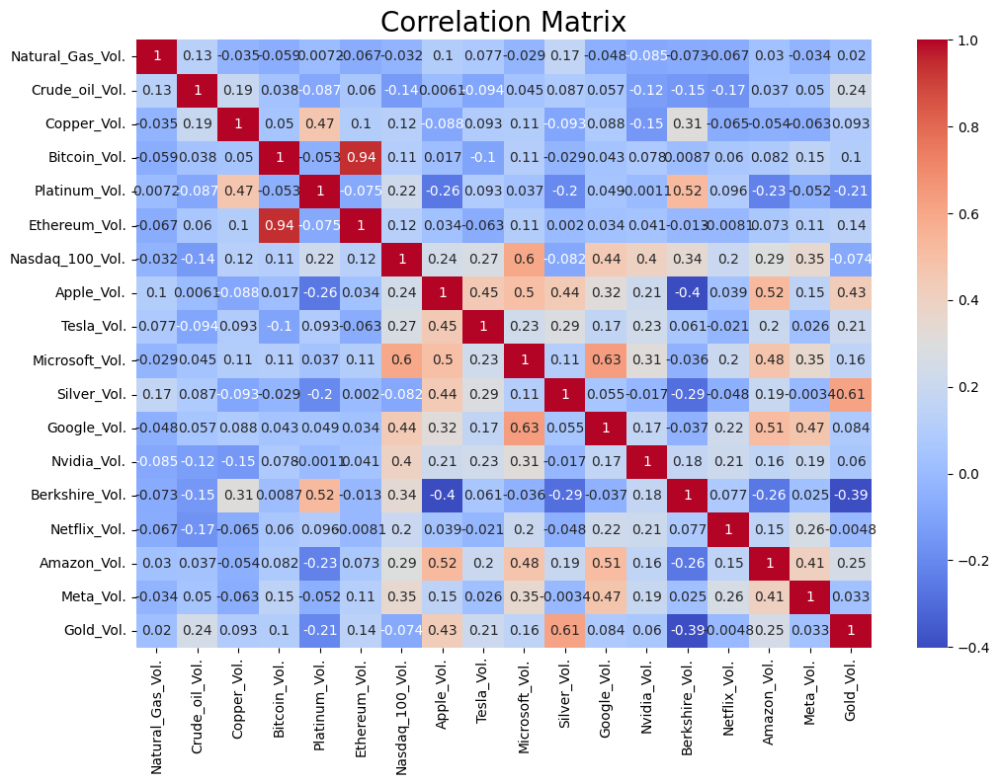

In [80]:
# make a heatmap of correlation matrix
plt.figure(figsize=(12, 8))
# delete date column
df_vol = df_vol.drop('Date', axis=1)
sns.heatmap(df_vol.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix', size=20)
plt.show()